# Quantum Supremacy Demonstration by Employing a Pulse-Based Variational Quantum Algorithm to Tackle a Large Optimization Problem - Draft 6

Ohad Lev

July 2024

-----------

## Reminder from *draft 5*

Last time, we have defined additional cost functions on top of the original QEMC cost function (which we define as $C_1$):

$$
    C_2 \big( E, P, B, D \big) = \sum_{(i, j) \in E}
    \Bigg[ \big(d_i - d_j\big)^2 \Bigg] \Bigg[
        \bigg(p_i + p_j - \frac{1}{|B|} \bigg)^2 +
        \bigg(\big|p_i - p_j\big| - \frac{1}{|B|} \bigg)^2
    \Bigg]
    \tag{1}
$$

$$
    C_4 \big( E, P, B, D \big) = \sum_{(i, j) \in E}
        \big(d_i - d_j\big)^2 +
        \bigg(p_i + p_j - \frac{1}{|B|} \bigg)^2 +
        \bigg(\big|p_i - p_j\big| - \frac{1}{|B|} \bigg)^2
    \tag{2}
$$

Where:

* $E$ is the set of edges of the undirected, unweighted graph $G = (V, E)$ ($V$ is the set of nodes).
* $P$ is the probability distribution reconstructed from multiple executions and measurements of the QEMC'S Ansatz circuit.
* $p_i, p_j$ are the probabilites in $P$ associated with the nodes $v_i, v_j \in V$.
* $B \subset V$ is the set of "blue" nodes.
* $D$ is the degree distribution of the graph nodes ($|D| = |V|$).
* $d_i, d_j \in D$ are the degrees of the nodes $v_i, v_j$.

We have performed ideal noiseless simulations of the QEMC algorithm for every combination of the following:

* $|V| \in \{32, 64, 128, 256, 512, 1024, 2048\}$ (columns).
* $|B| \in \{2, 4, 8, 16, 32\}$ (rows).
* $C \in \{C_1, C_2, C_4\}$ (curves - red, green, blue).

And obtained the following results:

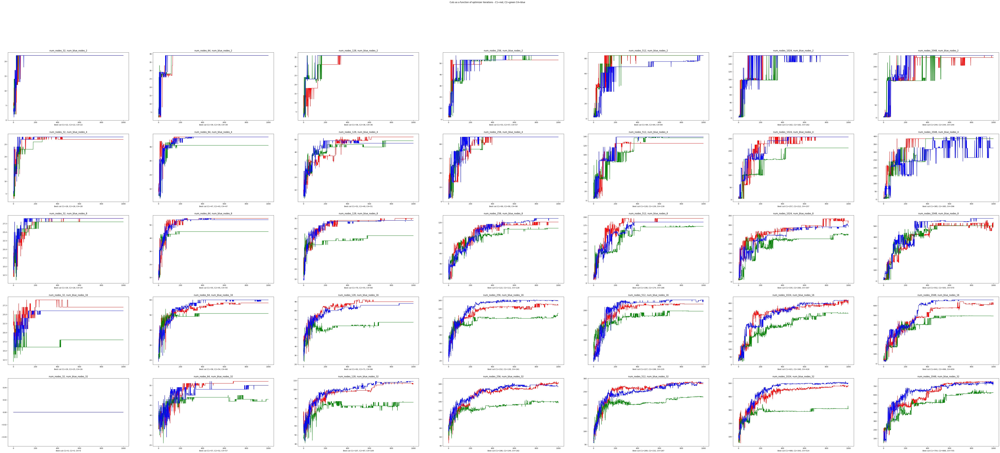

It can be seen, that unlike we thought initially - the QEMC cost function performs pretty well, as long as we choose the $|B|$ blue nodes according to the $|B|$ largest probabilities, as opposed to the original QEMC thresholding idea. Sometimes (or most of times?) the cost function $C_4$ performs slightly better. The performance of $C_2$ is worst.

## Comparing to random partitions

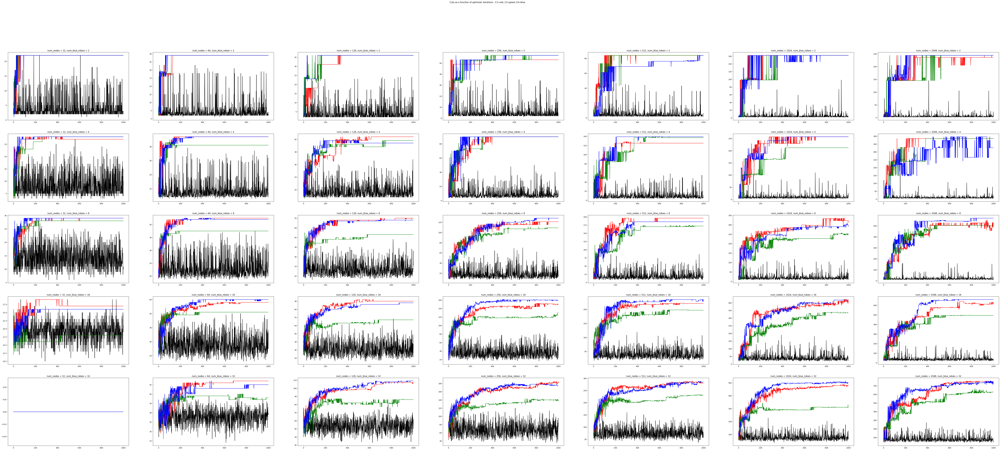

In [1]:
import os
from pathlib import Path

import h5py
import networkx as nx
import matplotlib.pyplot as plt

from draft_6_util_funs import obtain_random_partition, compute_cut_from_edges_list


fig, axes = plt.subplots(5, 7, figsize=(100, 40))

fig.suptitle("Cuts as a function of optimizer iterations - C1=red, C2=green C4=blue")

x_axis = range(1000)
opt_fun_colors = {
    "qemc_cost_fun": "red",
    "qemc_c2": "green",
    "qemc_c4": "blue"
}

num_nodes = [32, 64, 128, 256, 512, 1024, 2048]
num_blue_nodes = [2, 4, 8, 16, 32]
cost_functions_labels = ["c1", "c2", "c4"]

    
data_path = Path("draft_5_data/draft_5_fig_data/")
for index, hdf_filename in enumerate(sorted(os.listdir(data_path))):
    
    with h5py.File(Path(data_path, hdf_filename), "r") as f:
        
            
        current_num_nodes = f.attrs["num_nodes"]
        current_num_blue_nodes = f.attrs["num_blue_nodes"]
        
        row_index = num_blue_nodes.index(current_num_blue_nodes)
        col_index = num_nodes.index(current_num_nodes)
        
        cell = axes[row_index][col_index]
        
        if index % 3 == 0:
            
            random_cuts = [
                compute_cut_from_edges_list(
                    f.attrs["edges"],
                    obtain_random_partition(
                        num_nodes=current_num_nodes,
                        num_blue_nodes=current_num_blue_nodes
                    )
                )
                for _ in x_axis
            ]
            
            cell.plot(x_axis, random_cuts, color="black")
            
            cell.set_title(
                f"num_nodes = {current_num_nodes}, num_blue_ndoes = {current_num_blue_nodes}"
            )
        
#         best_cuts = []
        
        cell.plot(x_axis, f["cut_values"][:], color=opt_fun_colors[f.attrs["optimization_fun"]])
        
        
#         best_cuts.append(max(v3["data"]["cut_values"]))
#         cell.set_xlabel(f"Best cut C1={best_cuts[0]}, C2={best_cuts[1]}, C4={best_cuts[2]}")

## Executing with $\text{polylog}(|V|)$ number of shots


Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=25, cost_function=qemc_cost_fun
DONE. final_cut_value=3

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=25, cost_function=qemc_c2
DONE. final_cut_value=6

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=25, cost_function=qemc_c4
DONE. final_cut_value=4

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=25, cost_function=qemc_cost_fun
DONE. final_cut_value=5

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=25, cost_function=qemc_c2
DONE. final_cut_value=20

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=25, cost_function=qemc_c4
DONE. final_cut_value=15

Executi

DONE. final_cut_value=11

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=64, cost_function=qemc_c4
DONE. final_cut_value=6

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=64, cost_function=qemc_cost_fun
DONE. final_cut_value=11

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=64, cost_function=qemc_c2
DONE. final_cut_value=13

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=64, cost_function=qemc_c4
DONE. final_cut_value=10

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=64, cost_function=qemc_cost_fun
DONE. final_cut_value=45

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=64, cost_function=qemc_c2
DONE.

DONE. final_cut_value=70

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=121, cost_function=qemc_c2
DONE. final_cut_value=25

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=121, cost_function=qemc_c4
DONE. final_cut_value=21

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=121, cost_function=qemc_cost_fun
DONE. final_cut_value=64

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=121, cost_function=qemc_c2
DONE. final_cut_value=63

Executing QEMC with: num_nodes=[32, 64, 128, 256, 512, 1024, 2048], num_blue_nodes=[2, 4, 8, 16, 32], num_shots=121, cost_function=qemc_c4
DONE. final_cut_value=99


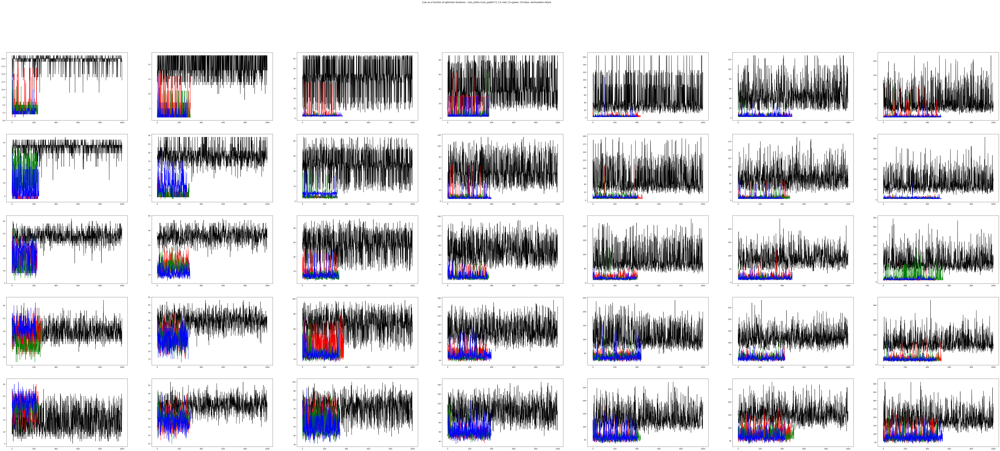

In [11]:
import numpy as np
from qiskit_aer import AerSimulator

from draft_6_util_funs import (
    obtain_high_degree_variance_graph,
    obtain_highest_degree_random_b_blue_nodes
)
from draft_5_util_funs import QEMC, qemc_c2, qemc_c4
from draft_4_util_funs import qemc_cost_fun, compute_cut


maxiter = 1_000
optimization_funs = [qemc_cost_fun, qemc_c2, qemc_c4]


fig, axes = plt.subplots(5, 7, figsize=(100, 40))
fig.suptitle(
    "Cuts as a function of optimizer iterations - num_shots=num_qubits**2, C1=red, C2=green, C4=blue, semirandom=black"
)


for current_num_nodes in num_nodes:
    
    graph = obtain_high_degree_variance_graph(current_num_nodes)
    num_shots = int(np.log2(current_num_nodes) ** 2)
    
    for current_num_blue_nodes in num_blue_nodes:
        
        row_index = num_blue_nodes.index(current_num_blue_nodes)
        col_index = num_nodes.index(current_num_nodes)        
        cell = axes[row_index][col_index]
        
        random_cuts = [
            compute_cut(
                graph,
                obtain_random_partition(
                    num_nodes=current_num_nodes,
                    num_blue_nodes=current_num_blue_nodes,
                    blue_nodes=obtain_highest_degree_random_b_blue_nodes(
                        graph, current_num_blue_nodes, num_shots
                    )
                )
            )
            for _ in x_axis
        ]

        cell.plot(x_axis, random_cuts, color="black")
        
        for optimization_fun in optimization_funs:

            qemc_executer = QEMC(
                graph=graph,
                num_blue_nodes=current_num_blue_nodes,
                quantum_backend=AerSimulator(shots=num_shots)
            )

            ansatz = qemc_executer.define_ansatz()

            print()
            print(
                f"Executing QEMC with: num_nodes={num_nodes}, num_blue_nodes={num_blue_nodes}, " \
                f"num_shots={num_shots}, cost_function={optimization_fun.__name__}"
            )

            qemc_result = qemc_executer.run(
                optimization_fun=optimization_fun,
                optimization_method="COBYLA",
                optimization_options={"maxiter": maxiter}
            )

            export_path = Path("/home/ohadlev77/personal/research/large_scale_variational_quantum_optimization/draft_6_data")
            QEMC.export_qemc_result_data(qemc_result, export_path)
            
#             from pprint import pprint
#             pprint(qemc_result)
            
            cell.plot(
                range(len(qemc_result["data"]["cut_values"])),
                qemc_result["data"]["cut_values"],
                color=opt_fun_colors[optimization_fun.__name__]
            )

            print(
                f"DONE. final_cut_value={qemc_result['data']['cut_values'][-1]}"
            )